In [1]:
%load_ext autoreload
%autoreload 2

import pickle
from itertools import product
from os import system
import numpy as np
import matplotlib.pyplot as plt
from corner import corner
from tqdm.auto import tqdm, trange
import dynesty
from dynesty import plotting as dyplot
from dynesty import utils as dyfunc
from scipy.optimize import root_scalar, minimize_scalar

import jax
import jax.numpy as jnp
from jax import random

from utils import *

## Astro system (from Eda et al)

### Setup

In [10]:
dd_s, rho_6, f_l, dd_v = setup_astro()

# Dephasing
dN = (Phi_to_c(f_l, dd_v) - Phi_to_c(f_l, dd_s)) / (2 * pi)
print(f"dN (naive): {dN}")

x = jnp.array(
    [dd_s.gamma_s, rho_6_to_rho6T(rho_6), dd_s.M_chirp / MSUN, jnp.log10(dd_s.q)]
)
print("log(L) at signal point: ", get_loglikelihood(x, dd_s, f_l))

dN (naive): 11087.884457938806
log(L) at signal point:  42.47274188945182


In [19]:
gamma_s_range = [2.25, 2.5]
rho_6T_range = [0.2, 1.2]  # CHANGE
log10_q_range = [-3.5, -2.5]
dM_chirp_MSUN_range = [-0.006, 0.005]

# Capture globals
ptform = lambda u: get_ptform(
    u, gamma_s_range, rho_6T_range, log10_q_range, dM_chirp_MSUN_range, dd_s
)
loglikelihood = lambda x: get_loglikelihood(x, dd_s, f_l)

### Run nested sampler

In [20]:
sampler = dynesty.NestedSampler(loglikelihood, ptform, 4, nlive=500)
sampler.run_nested()
results_astro = sampler.results_astro
results_astro.summary()

9201it [2:45:34,  1.08s/it, +500 | bound: 208 | nc: 1 | ncall: 180043 | eff(%):  5.388 | loglstar:   -inf < 42.429 <    inf | logz: 24.724 +/-  0.269 | dlogz:  0.001 >  0.509]


Summary
nlive: 500
niter: 9201
ncall: 180043
eff(%):  5.388
logz: 24.724 +/-  0.269


In [21]:
system('say done with nested sampling')

0

In [23]:
# Save results_astro_4d!
with open('ns-results-astro.pkl', 'wb') as output:
    pickle.dump(results_astro, output, pickle.HIGHEST_PROTOCOL)

# # Load results_astro
# with open('ns-results-astro.pkl', 'rb') as input:
#     results_astro = pickle.load(input)

### Diagnostics

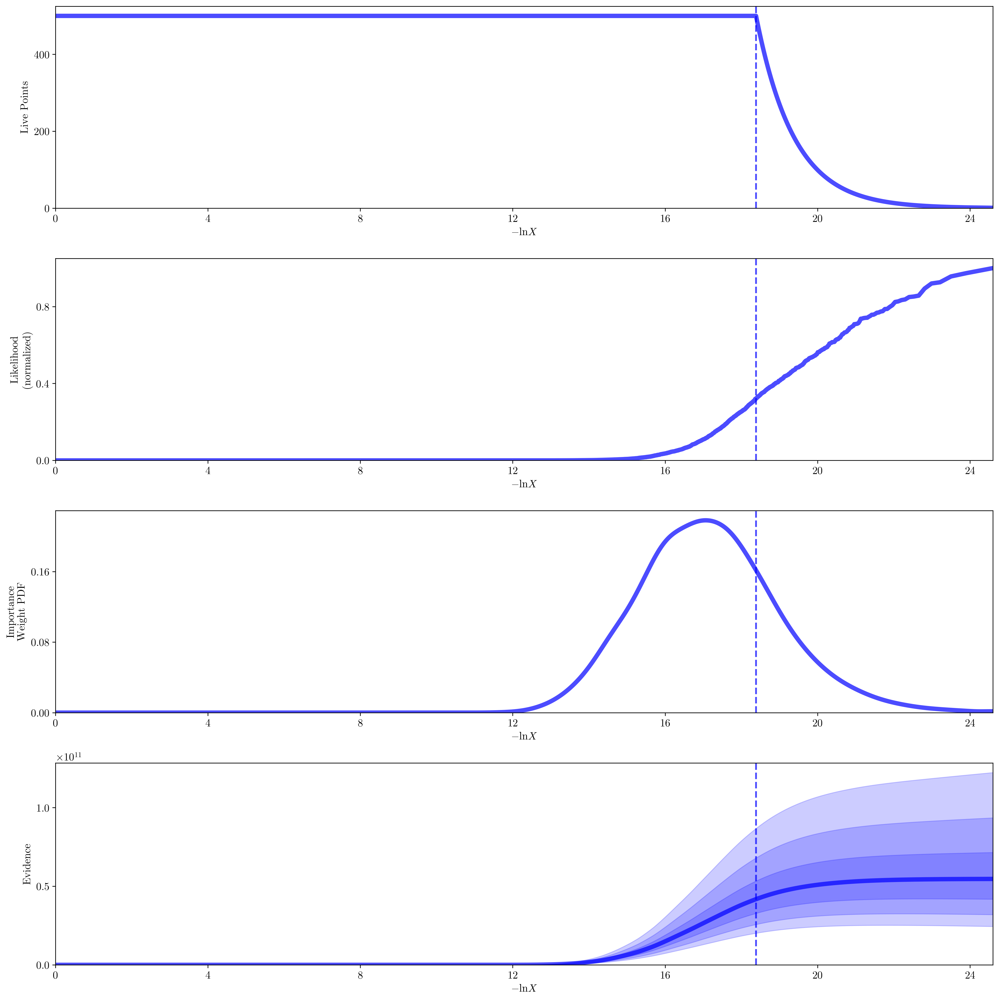

In [24]:
rfig, raxes = dyplot.runplot(results_astro)
rfig.tight_layout()

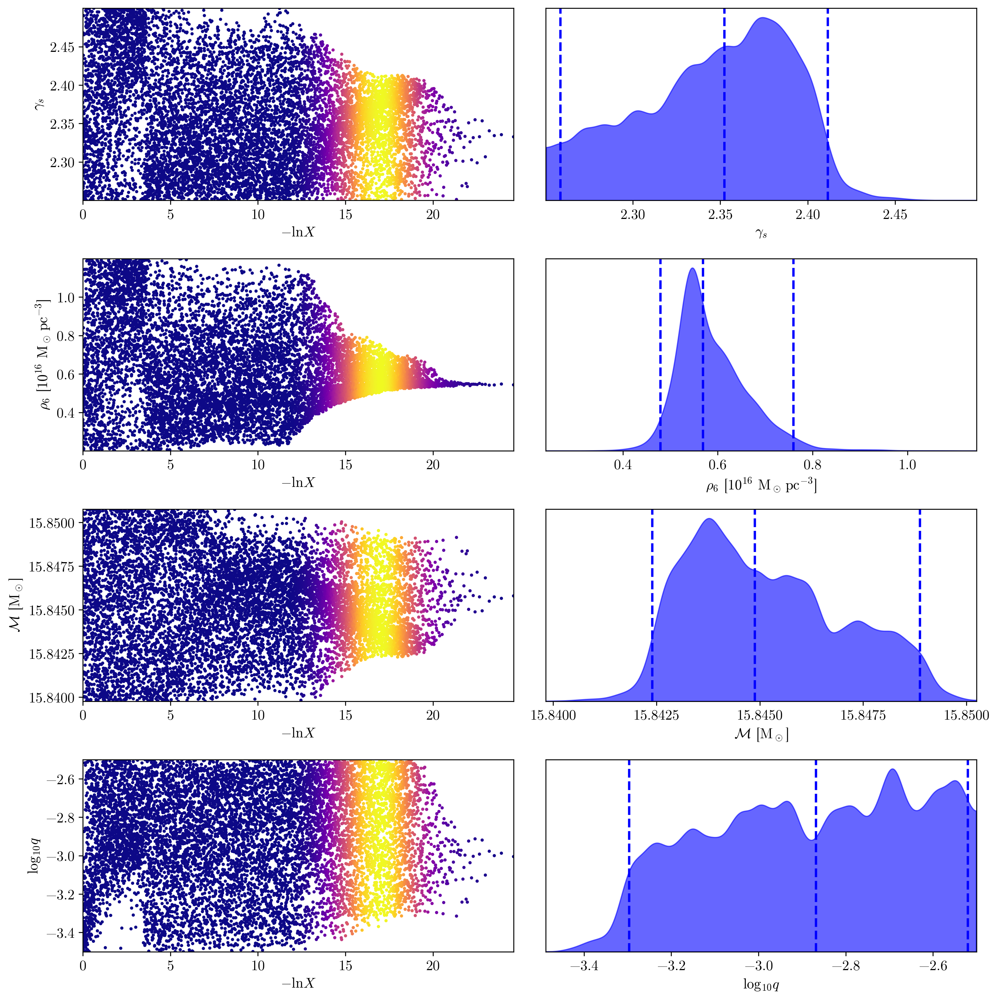

In [25]:
tfig, taxes = dyplot.traceplot(results_astro, labels=labels)
tfig.tight_layout()

### Final posteriors

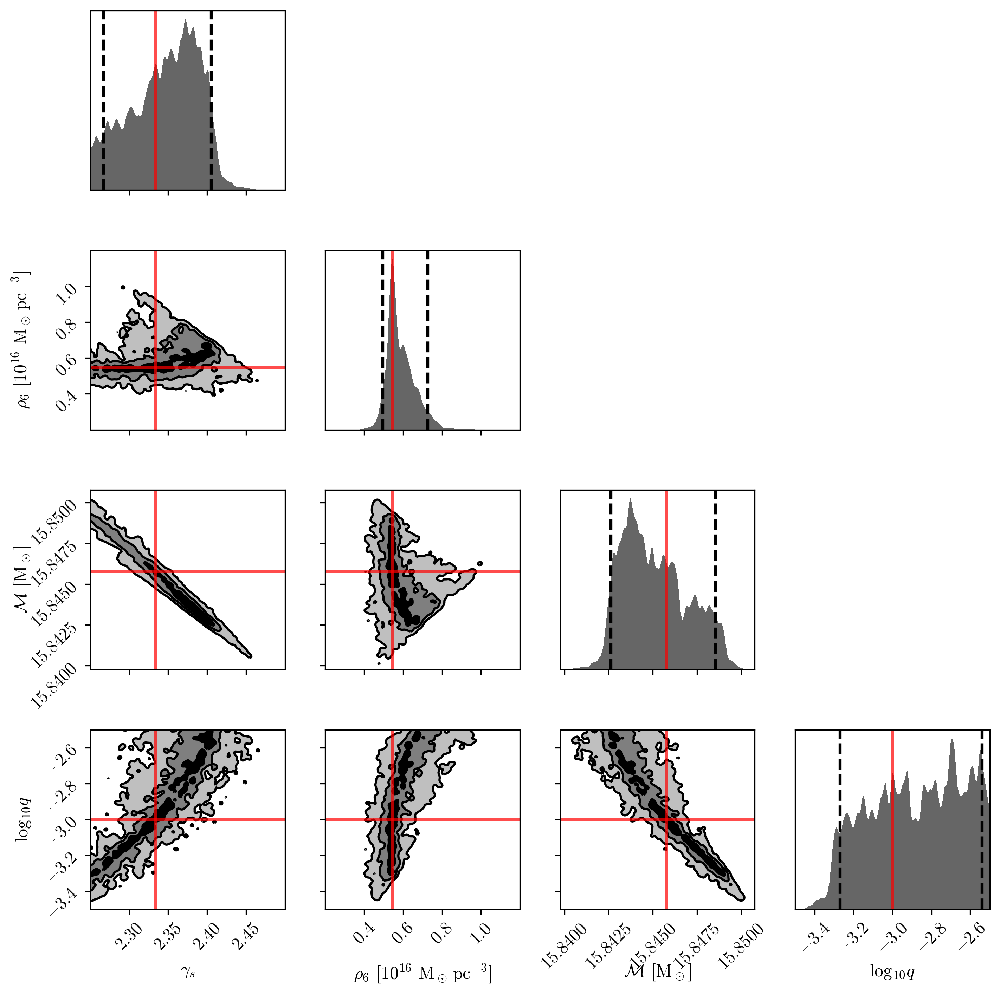

In [28]:
cfig, caxes = dyplot.cornerplot(
    results_astro,
    labels=labels,
    quantiles=quantiles,
    quantiles_2d=quantiles_2d,
    smooth=0.01,
    truths=(
        gamma_s,
        rho_6_to_rho6T(rho_6),
        dd_s.M_chirp / MSUN,
        jnp.log10(dd_s.q),
    ),
    span=[1, 1, 1, 1]
)
cfig.tight_layout()
cfig.savefig("ns-astro.pdf")
cfig.savefig("ns-astro.png")

## PBH system (from Adamek et al)

### Setup

In [11]:
dd_s, rho_6, f_l, dd_v = setup_pbh()

# Dephasing
dN = (Phi_to_c(f_l, dd_v) - Phi_to_c(f_l, dd_s)) / (2 * pi)
print(f"dN (naive): {dN}")

x = jnp.array(
    [dd_s.gamma_s, rho_6_to_rho6T(rho_6), dd_s.M_chirp / MSUN, jnp.log10(dd_s.q)]
)
print("log(L) at signal point: ", get_loglikelihood(x, dd_s, f_l))

dN (naive): 6768.179097045447
log(L) at signal point:  42.47422080940605


In [36]:
gamma_s_range = [2.25, 2.5]
rho_6T_range = [0.2, 1.2]  # CHANGE
log10_q_range = [-3.5, -2.5]
dM_chirp_MSUN_range = [-0.006, 0.005]

# Capture globals
ptform = lambda u: get_ptform(
    u, gamma_s_range, rho_6T_range, log10_q_range, dM_chirp_MSUN_range, dd_s
)
loglikelihood = lambda x: get_loglikelihood(x, dd_s)

### Run nested sampler

In [37]:
sampler = dynesty.NestedSampler(loglikelihood, ptform, 4, nlive=500)
sampler.run_nested()
results_pbh = sampler.results
results_pbh.summary()

8942it [2:03:50,  1.20it/s, +500 | bound: 139 | nc: 1 | ncall: 124400 | eff(%):  7.590 | loglstar:   -inf < 42.390 <    inf | logz: 25.219 +/-  0.262 | dlogz:  0.001 >  0.509]


AttributeError: 'MultiEllipsoidSampler' object has no attribute 'results_pbh'

In [38]:
results_pbh = sampler.results
results_pbh.summary()

Summary
nlive: 500
niter: 8942
ncall: 124400
eff(%):  7.590
logz: 25.219 +/-  0.262


In [39]:
system('say done with pbh nested sampling')

0

In [40]:
# Save results_pbh_4d!
with open('ns-results-pbh.pkl', 'wb') as output:
    pickle.dump(results_pbh, output, pickle.HIGHEST_PROTOCOL)

# # Load results_pbh
# with open('ns-results-pbh.pkl', 'rb') as input:
#     results_pbh = pickle.load(input)

### Diagnostics

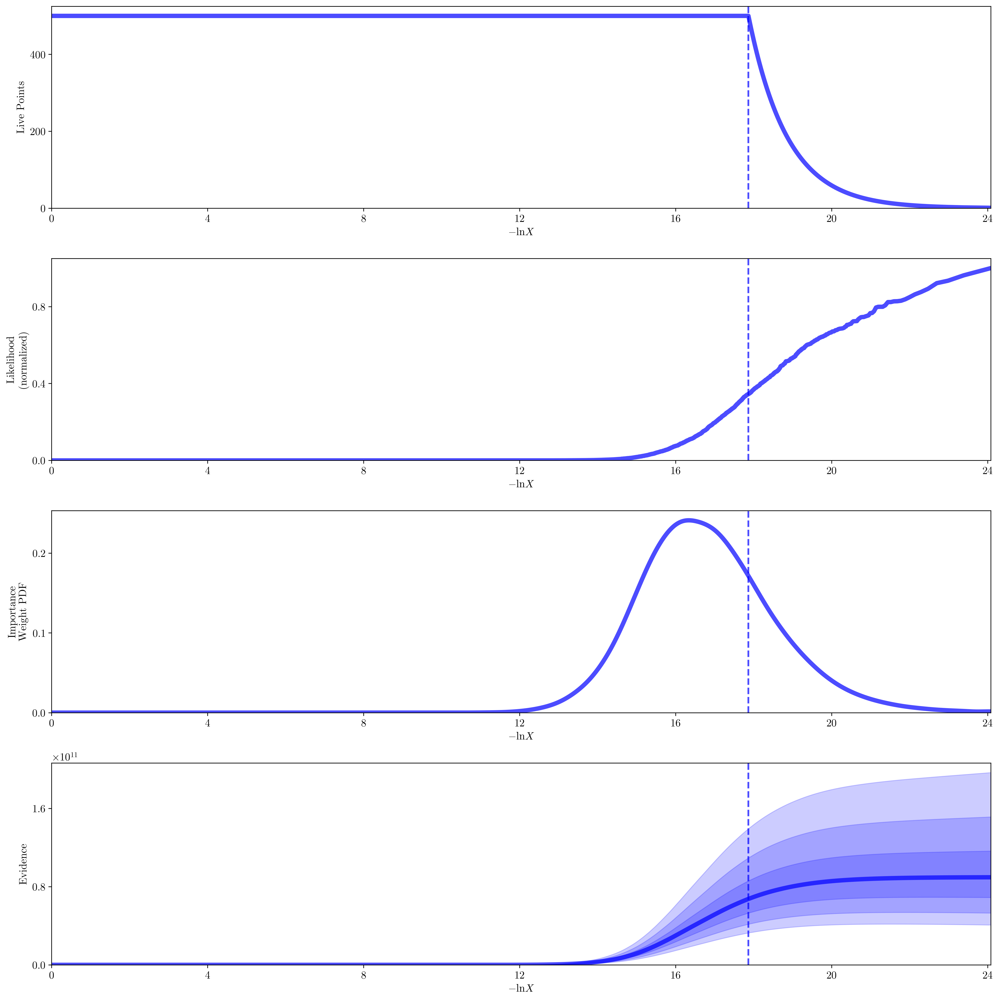

In [41]:
rfig, raxes = dyplot.runplot(results_pbh)
rfig.tight_layout()

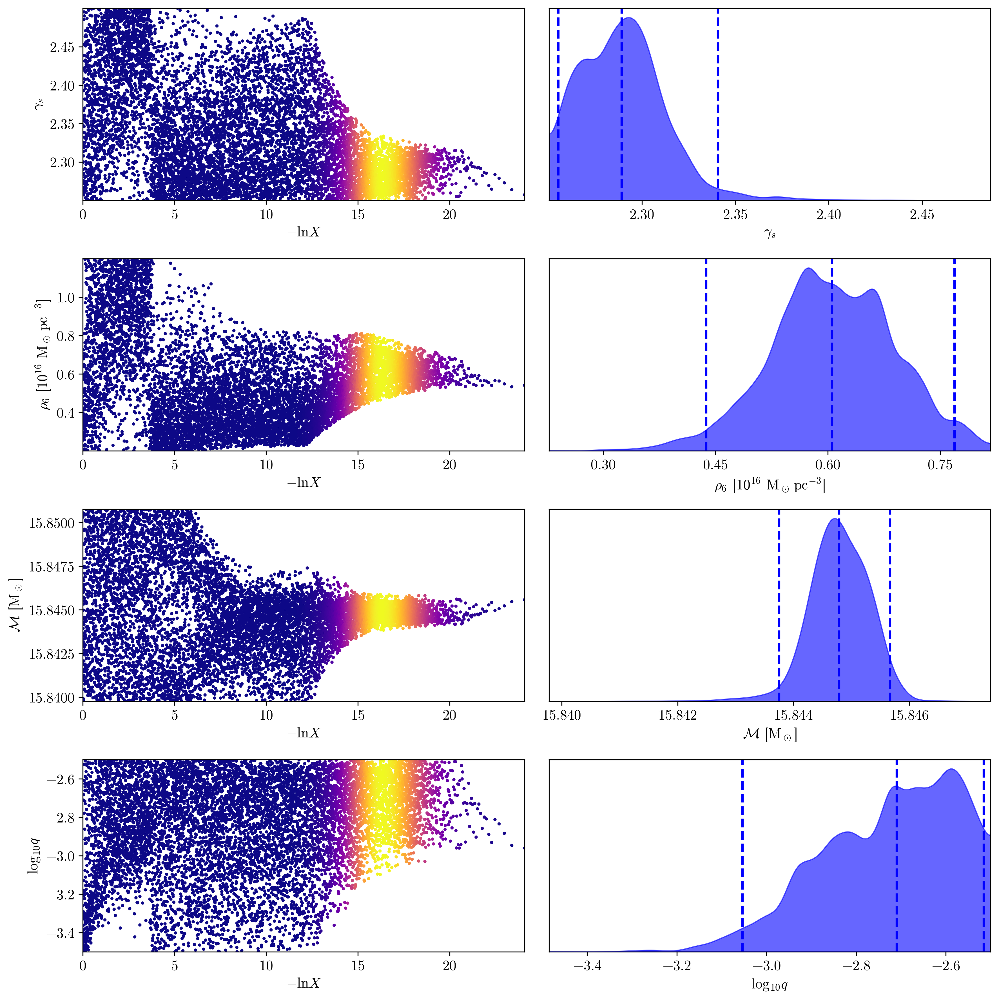

In [42]:
tfig, taxes = dyplot.traceplot(results_pbh, labels=labels)
tfig.tight_layout()

In [43]:
quantiles = [1 - 0.95, 0.95]
quantiles_2d = [1 - np.exp(-(x ** 2) / 2) for x in [1, 2, 3]]

### Final posteriors

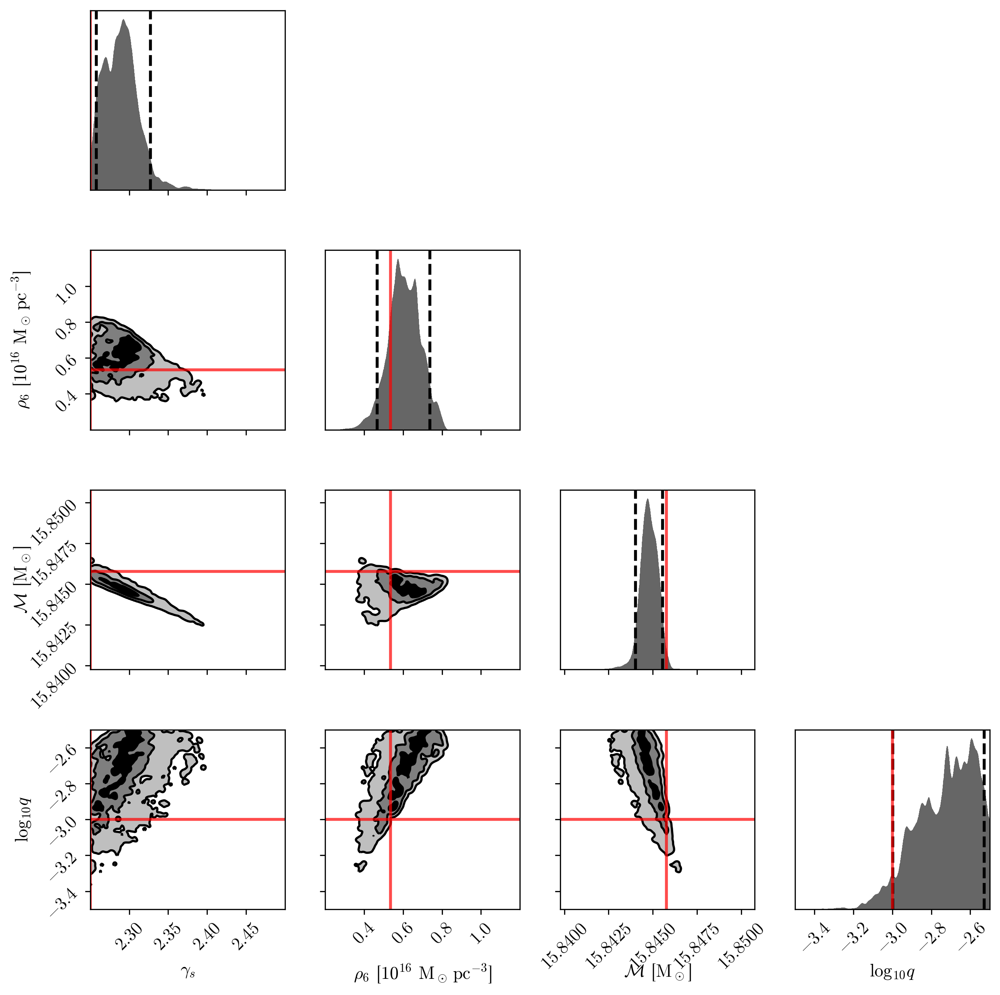

In [44]:
cfig, caxes = dyplot.cornerplot(
    results_pbh,
    labels=labels,
    quantiles=quantiles,
    quantiles_2d=quantiles_2d,
    smooth=0.01,
    truths=(
        gamma_s,
        rho_6_to_rho6T(rho_6),
        dd_s.M_chirp / MSUN,
        jnp.log10(dd_s.q),
    ),
    span=[1, 1, 1, 1]
)
cfig.tight_layout()
cfig.savefig("ns-pbh.pdf")
cfig.savefig("ns-pbh.png")

## Properties of best-fit vacuum system

In [ ]:
m_1 = 1e3 * MSUN
m_2 = 1 * MSUN
M_chirp_MSUN = get_M_chirp(m_1, m_2) / MSUN
bracket = (M_chirp_MSUN, M_chirp_MSUN + 1e-1)

rho_6s = jnp.geomspace(rho_6T_to_rho6(1e-4), rho_6T_to_rho6(1.0), 18)
rho_6Ts = rho_6_to_rho6T(rho_6s)
gamma_ss = jnp.linspace(2.25, 2.5, 17)

M_chirp_MSUN_bests = np.full([len(rho_6s), len(gamma_ss)], np.nan)
M_chirp_MSUN_best_errs = np.full([len(rho_6s), len(gamma_ss)], np.nan)
matches = np.full([len(rho_6s), len(gamma_ss)], np.nan)
snrs = np.full([len(rho_6s), len(gamma_ss)], np.nan)
dNs = np.full([len(rho_6s), len(gamma_ss)], np.nan)
dN_naives = np.full([len(rho_6s), len(gamma_ss)], np.nan)
rho_ss = np.full([len(rho_6s), len(gamma_ss)], np.nan)

for i, rho_6 in enumerate(tqdm(rho_6s)):
    for j, gamma_s in enumerate(gamma_ss):
        dd_s, f_l = setup_system(gamma_s, rho_6)

        rho_ss[i, j] = get_rho_s(rho_6, m_1, gamma_s)

        # Dark dress SNR
        snrs[i, j] = calculate_SNR(dd_s, f_l, dd_s.f_c, 3000)

        # Dephasing relative to system with no DM
        dd_v = VacuumBinary(
            M_chirp_MSUN * MSUN, dd_s.Phi_c, dd_s.tT_c, dd_s.dL_iota, dd_s.f_c
        )
        dN_naives[i, j] = (Phi_to_c(f_l, dd_v) - Phi_to_c(f_l, dd_s)) / (2 * pi)

#         if rho_6_to_rho6T(rho_6) < 1e-2:
        # Find best-fit vacuum system
        fun = lambda x: -get_loglikelihood_v([x], dd_s, f_l)
        res = minimize_scalar(fun, bracket, tol=1e-15)
        assert res.success
        M_chirp_MSUN_best = res.x
        M_chirp_MSUN_bests[i, j] = M_chirp_MSUN_best
        # Compute M_chirp error bars
        M_chirp_MSUN_grid = jnp.linspace(
            M_chirp_MSUN_best - 2e-5, M_chirp_MSUN_best + 2e-5, 500
        )
        loglikelihoods = jax.lax.map(
            lambda x: get_loglikelihood_v([x], dd_s, f_l), M_chirp_MSUN_grid
        )
        norm = jnp.trapz(jnp.exp(loglikelihoods), M_chirp_MSUN_grid)
        M_chirp_MSUN_best_errs[i, j] = jnp.sqrt(
            jnp.trapz(
                (M_chirp_MSUN_grid - M_chirp_MSUN_best) ** 2
                * jnp.exp(loglikelihoods),
                M_chirp_MSUN_grid,
            )
            / norm
        )
        dd_v_best = VacuumBinary(
            M_chirp_MSUN_best * MSUN, dd_s.Phi_c, dd_s.tT_c, dd_s.dL_iota, dd_s.f_c
        )
        # SNR between best-fit vacuum system and dark dress
        matches[i, j] = calculate_match_unnormd_fft(
            dd_v_best, dd_s, f_l, dd_s.f_c, 100_000
        )
        # Dephasing relative to best-fit vacuum system
        dNs[i, j] = (Phi_to_c(f_l, dd_v_best) - Phi_to_c(f_l, dd_s)) / (2 * pi)

M_chirp_MSUN_bests = jnp.array(M_chirp_MSUN_bests)
matches = jnp.array(matches)
snrs = jnp.array(snrs)
dNs = jnp.array(dNs)
rho_ss = jnp.array(rho_ss)

  0%|          | 0/18 [00:00<?, ?it/s]

In [ ]:
import matplotlib.colors as colors

fig, axes = plt.subplots(2, 2, figsize=(8, 6.5))

ax = axes[0, 0]
# levels = jnp.geomspace(1, 550, 10, dtype=int)
levels = jnp.geomspace(1, 31625, 10, dtype=int)
cs = ax.contourf(
    rho_6Ts,
    gamma_ss,
    jnp.log10(dN_naives).T,
    cmap="plasma",
    levels=jnp.log10(levels),
)
plt.colorbar(
    cs,
    ax=ax,
    fraction=0.055,
    pad=0.04,
    label=r"$N_\mathrm{no~DM} - N_\mathrm{D}$",
    ticks=jnp.log10(levels)[::2],
).ax.set_yticklabels(levels[::2])

ax = axes[0, 1]
levels = jnp.array([-5, -4, -3, -2, -1, 0.1])
cs = ax.contourf(rho_6Ts, gamma_ss, dNs.T, levels=levels)
plt.colorbar(
    cs, ax=ax, fraction=0.055, pad=0.04, label=r"$N_\mathrm{V} - N_\mathrm{D}$"
).ax.set_yticklabels(levels.astype(int))
ax.fill_between([2e-3, 9e-3], 2.42, 2.49, color="w")
ax.text(1.5e-2, 2.48, r"$< -5$", ha="center", va="center", backgroundcolor="w")

ax = axes[1, 0]
cs = ax.contourf(
    rho_6Ts,
    gamma_ss,
    ((M_chirp_MSUN_bests - M_chirp_MSUN) / M_chirp_MSUN_best_errs).T,
    levels=jnp.linspace(0, 120, 7),
#     norm=colors.LogNorm(),
    cmap="cividis",
)
plt.colorbar(
    cs,
    ax=ax,
    fraction=0.055,
    pad=0.04,
    label=r"$(\mathcal{M}_V - \mathcal{M}) / \Delta\mathcal{M}_V$",
)
ax.text(1.5e-2, 2.48, r"$> 10^{-4}$", ha="center", va="center", backgroundcolor="w")

ax = axes[1, 1]
cs = ax.contourf(
    rho_6Ts,
    gamma_ss,
    jnp.clip((snrs - jnp.sqrt(matches)) / snrs, a_min=0).T * 100,
    levels=jnp.linspace(0, 10, 11),
    cmap="magma",
)
plt.colorbar(
    cs,
    ax=ax,
    fraction=0.055,
    pad=0.04,
    label="% SNR loss with V",
)
ax.text(1.5e-2, 2.48, r"$> 10\%$", ha="center", va="center", backgroundcolor="w")

for ax in axes.flatten():
    ax.set_xscale("log")
    ax.set_xlabel(r"$\rho_6$ [$10^{16}$ $\mathrm{M}_\odot \, \mathrm{pc}^{-3}$]")
    ax.set_ylabel(r"$\gamma_s$")
    # Benchmarks
    ax.scatter([rho_6_to_rho6T(setup_astro()[1])], [7/3], marker="*", color="r", s=100)
    ax.scatter([rho_6_to_rho6T(setup_pbh()[1])], [9/4], marker=".", color="r", s=200)
    # rho_s contours
    cs = ax.contour(
        rho_6Ts,
        gamma_ss,
        jnp.log10(rho_ss.T / (MSUN / PC ** 3)),
#         levels=jnp.linspace(-23, -3, 6),
        levels=[-32, -16, -8, -4, -2, 0, 2, 4],  # jnp.linspace(-26, 4, 7),
        colors=["k"],
        linestyles=["--"],
        linewidths=[0.5]
    )
    ax.clabel(cs, inline=True, fontsize=8, fmt=r"$10^{%i}$")

fig.tight_layout()

In [275]:
rho_6, gamma_s = rho_6s[4], gamma_ss[7]
dd_s, f_l = setup_system(gamma_s, rho_6)

# Find best-fit vacuum system
fun = lambda x: -get_loglikelihood_v([x], dd_s, f_l)
res = minimize_scalar(fun, bracket, tol=1e-15)
assert res.success
M_chirp_MSUN_best = res.x

In [281]:
# Compute M_chirp error bars
M_chirp_MSUN_grid = jnp.linspace(
    M_chirp_MSUN_best - 2e-4, M_chirp_MSUN_best + 2e-4, 500
)
loglikelihoods = jax.lax.map(
    lambda x: get_loglikelihood_v([x], dd_s, f_l), M_chirp_MSUN_grid
)
norm = jnp.trapz(jnp.exp(loglikelihoods), M_chirp_MSUN_grid)
jnp.sqrt(
    jnp.trapz(
        (M_chirp_MSUN_grid - M_chirp_MSUN_best) ** 2
        * jnp.exp(loglikelihoods),
        M_chirp_MSUN_grid,
    )
    / norm
)

DeviceArray(0.00011495, dtype=float64)

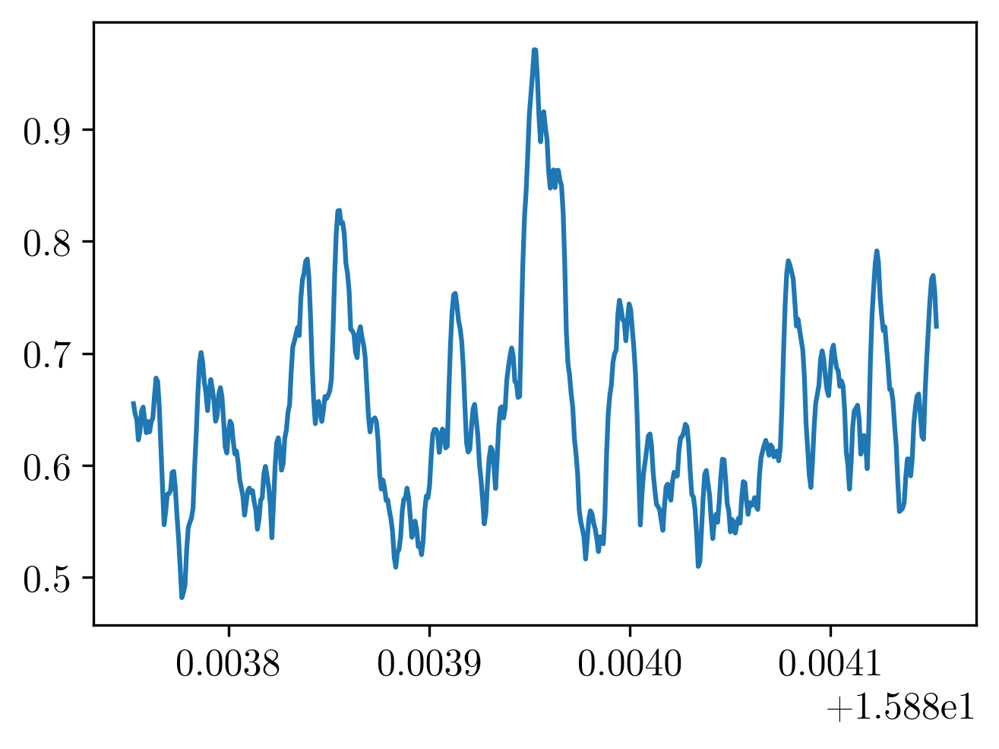

In [282]:
plt.plot(M_chirp_MSUN_grid, loglikelihoods)

In [233]:
M_chirp_MSUN_grid = jnp.linspace(
    M_chirp_MSUN_best - 2e-5, M_chirp_MSUN_best + 2e-5, 500
)
# Compute M_chirp error bars
loglikelihoods = jax.lax.map(
    lambda x: get_loglikelihood_v([x], dd_s, f_l), M_chirp_MSUN_grid
)
norm = jnp.trapz(jnp.exp(loglikelihoods), M_chirp_MSUN_grid)
sigma = jnp.sqrt(
    jnp.trapz(
        (M_chirp_MSUN_grid - M_chirp_MSUN_best) ** 2 * jnp.exp(loglikelihoods),
        M_chirp_MSUN_grid,
    )
    / norm
)

DeviceArray(1.54328864e-06, dtype=float64)

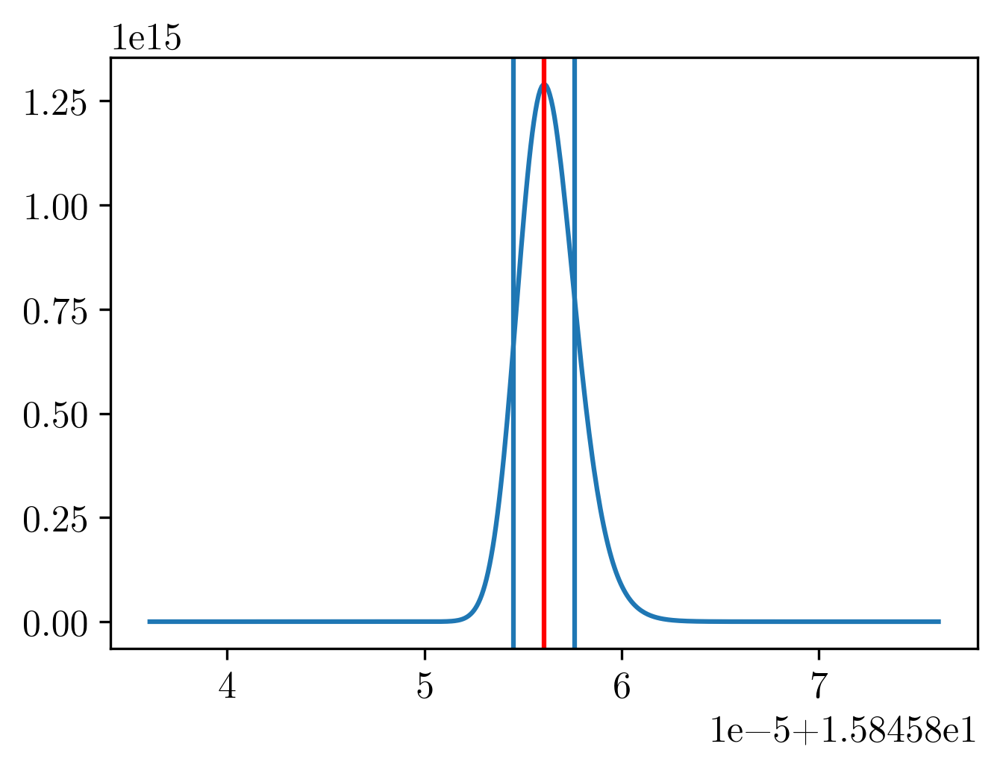

In [232]:
plt.plot(M_chirp_MSUN_grid, jnp.exp(loglikelihoods))
plt.axvline(M_chirp_MSUN_best - sigma)
plt.axvline(M_chirp_MSUN_best, color="r")
plt.axvline(M_chirp_MSUN_best + sigma)
sigma

#### Manual checks

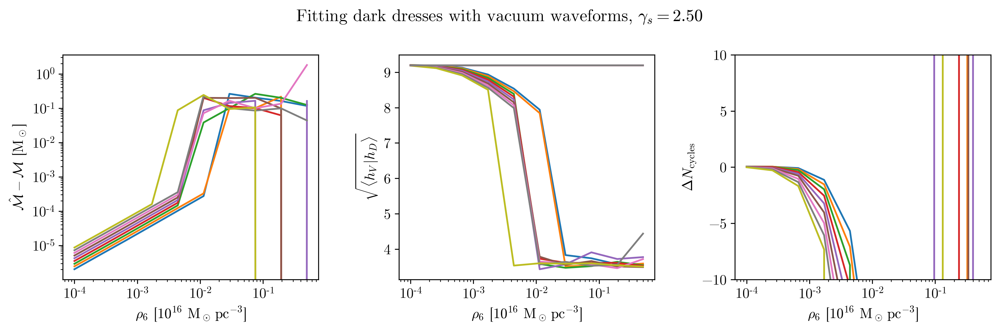

In [130]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

ax = axes[0]
ax.loglog(rho_6Ts, M_chirp_MSUN_bests - dd_s.M_chirp / MSUN)
# ax.axvline(rho_6Ts, color="r", linestyle="--", linewidth=0.5)
ax.set_xlabel(r"$\rho_6$ [$10^{16}$ $\mathrm{M}_\odot \, \mathrm{pc}^{-3}$]")
ax.set_ylabel(r"$\hat{\mathcal{M}} - \mathcal{M}$ [M$_\odot$]")

ax = axes[1]
ax.semilogx(rho_6Ts, jnp.sqrt(matches))
ax.semilogx(rho_6Ts, snrs)
ax.set_xlabel(r"$\rho_6$ [$10^{16}$ $\mathrm{M}_\odot \, \mathrm{pc}^{-3}$]")
ax.set_ylabel(r"$\sqrt{\langle h_V \, | h_D \rangle}$")

ax = axes[2]
ax.semilogx(rho_6Ts, dNs)
ax.set_xlabel(r"$\rho_6$ [$10^{16}$ $\mathrm{M}_\odot \, \mathrm{pc}^{-3}$]")
ax.set_ylabel(r"$\Delta N_\mathrm{cycles}$")
ax.set_ylim(-10, 10)

fig.suptitle(
    "Fitting dark dresses with vacuum waveforms, " r"$\gamma_s = %.2f$" % gamma_s
)
fig.tight_layout()

In [152]:
dd_s, f_l = setup_system(7/3, 0.5e16 / 50 * MSUN / PC**3)

In [153]:
fun = lambda x: -get_loglikelihood_v([x], dd_s, f_l)
res = minimize_scalar(fun, bracket, tol=1e-15)
assert res.success
dd_v = VacuumBinary(
    res.x * MSUN, dd_s.Phi_c, dd_s.tT_c, dd_s.dL_iota, dd_s.f_c
)

Text(0, 0.5, '$\\Psi_V - \\Psi_d$ [rad]')

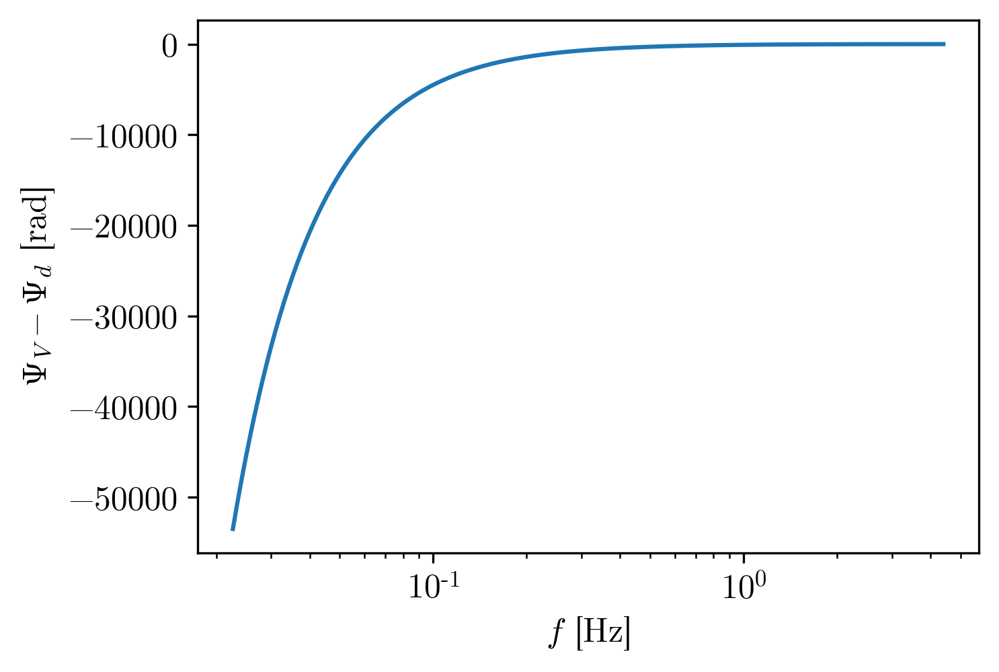

In [154]:
fs = jnp.geomspace(f_l, dd_s.f_c, 500)
Psi_s = Phi_to_c(fs, dd_s) - 2 * pi * fs * t_to_c(fs, dd_s)
Psi_v = Phi_to_c(fs, dd_v) - 2 * pi * fs * t_to_c(fs, dd_v)
plt.semilogx(fs, Psi_v - Psi_s)
plt.xlabel(r"$f$ [Hz]")
plt.ylabel(r"$\Psi_V - \Psi_d$ [rad]")

In [155]:
results = []
t_cs = jnp.linspace(-300, 10, 100)
for t_c in tqdm(t_cs):
    int_complex = 4 * jnp.trapz(
        jnp.exp(
            1j * (Psi(fs, dd_v) - Psi(fs, dd_s) + 2 * pi * fs * t_c)
        ) * amp_plus(fs, dd_s) * amp_plus(fs, dd_v) / S_n_LISA(fs),
        fs
    )
    results.append(jnp.sqrt(jnp.abs(int_complex)))

  0%|          | 0/100 [00:00<?, ?it/s]

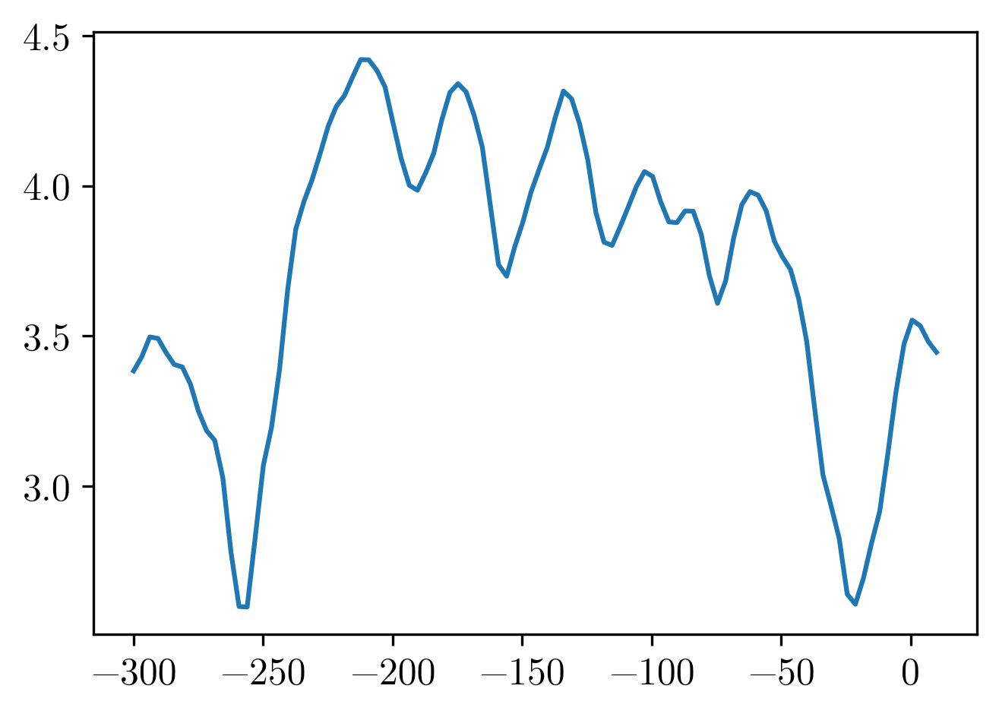

In [156]:
plt.plot(t_cs, results)

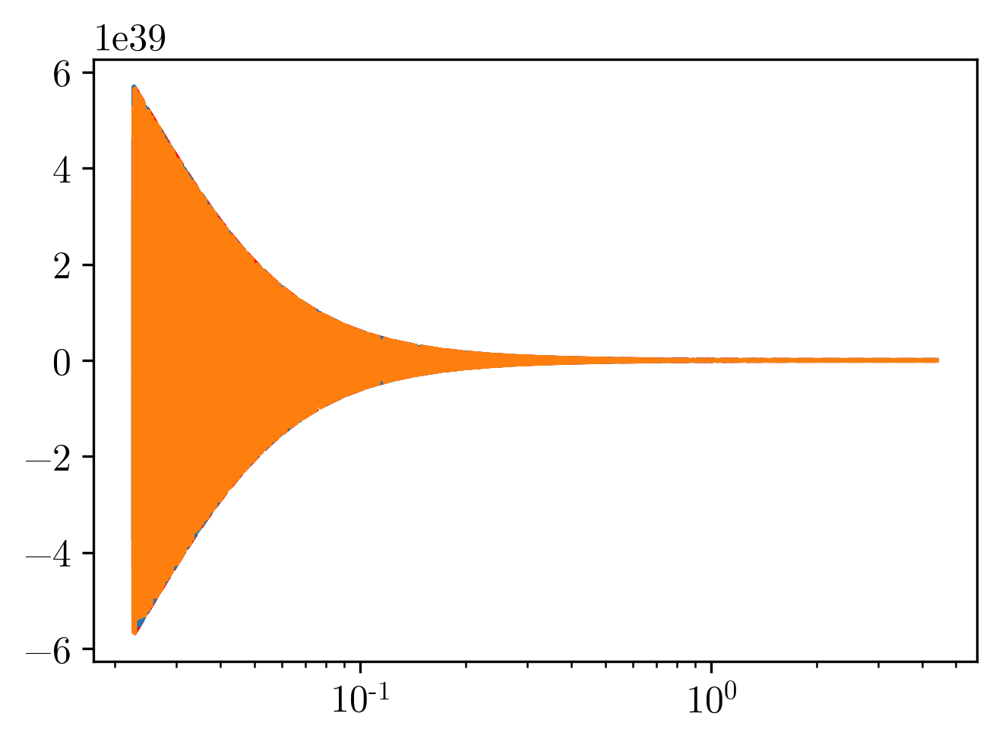

In [158]:
fs = jnp.geomspace(f_l, dd_s.f_c, 10_000)
Psi_s = Phi_to_c(fs, dd_s) - 2 * pi * fs * t_to_c(fs, dd_s)
Psi_v = Phi_to_c(fs, dd_v) - 2 * pi * fs * t_to_c(fs, dd_v)
plt.semilogx(fs, 1 / S_n_LISA(fs), "--r")
plt.semilogx(fs, -1 / S_n_LISA(fs), "--r")
plt.semilogx(fs, jnp.cos(Psi_v - Psi_s) / S_n_LISA(fs))
plt.semilogx(fs, jnp.sin(Psi_v - Psi_s) / S_n_LISA(fs))

## Evidence comparison

In [130]:
rho_6 = 5.5e15 * MSUN / PC**3 / 50
dd_s, f_l = setup_system(gamma_s, rho_6)

### Vacuum system

In [133]:
M_chirp_MSUN_range_v = (dd_s.M_chirp / MSUN + 1e-4, dd_s.M_chirp / MSUN + 1e-3)

ptform_v = lambda u: get_ptform_v(u, M_chirp_MSUN_range_v)
loglikelihood_v = lambda x: get_loglikelihood_v(x, dd_s, f_l)

sampler_v = dynesty.NestedSampler(loglikelihood_v, ptform_v, 1, nlive=100, bound="multi")
sampler_v.run_nested()
results_v = sampler_v.results
results_v.summary()

655it [02:09,  5.07it/s, +100 | bound: 4 | nc: 1 | ncall: 4215 | eff(%): 17.912 | loglstar:   -inf < 20.867 <    inf | logz: 16.626 +/-  0.265 | dlogz:  0.001 >  0.109]

Summary
nlive: 100
niter: 655
ncall: 4215
eff(%): 17.912
logz: 16.626 +/-  0.265


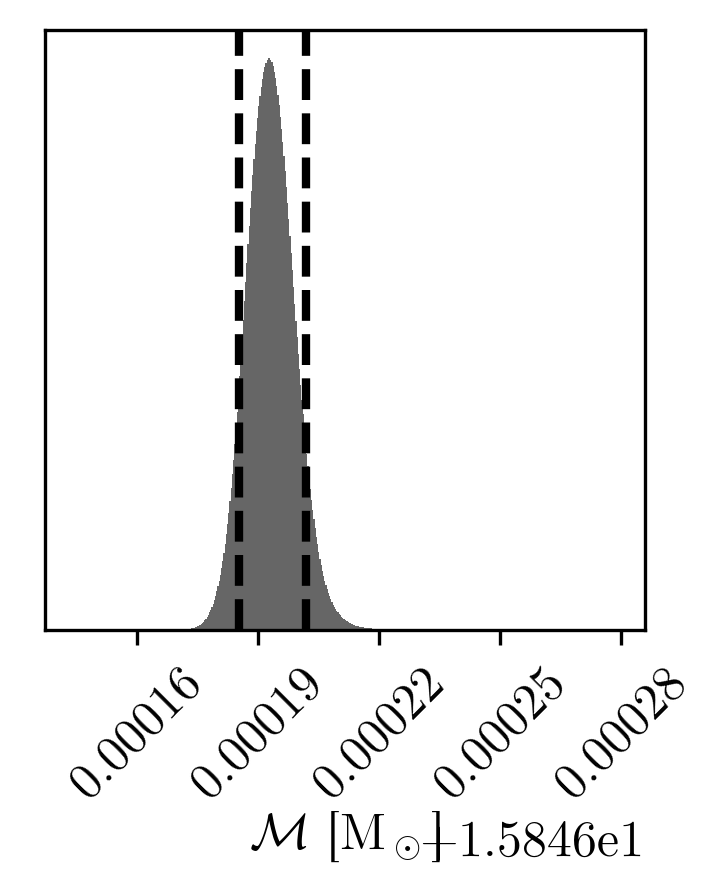

In [134]:
cfig, caxes = dyplot.cornerplot(
    results_v, labels=[r"$\mathcal{M}$ [M$_\odot$]"], quantiles=[1 - 0.95, 0.95]
)
cfig.savefig("ns-discoverable-v.pdf")
cfig.savefig("ns-discoverable-v.png")

### Dark dress

In [135]:
gamma_s_range = [2.25, 2.5]
rho_6T_range = [0.1 / 100, 2.0 / 40]
log10_q_range = [-3.5, -2.5]
dM_chirp_MSUN_range = [-0.005, 0.004]

# Capture globals
ptform = lambda u: get_ptform(
    u, gamma_s_range, rho_6T_range, log10_q_range, dM_chirp_MSUN_range
)
loglikelihood = lambda x: get_loglikelihood(x, dd_s, f_l)

sampler = dynesty.NestedSampler(loglikelihood, ptform, 4, nlive=500)
sampler.run_nested()
results_evidence = sampler.results
results_evidence.summary()

6695it [39:17,  2.84it/s, +500 | bound: 33 | nc: 1 | ncall: 42944 | eff(%): 16.754 | loglstar:   -inf < 42.458 <    inf | logz: 29.891 +/-  0.218 | dlogz:  0.001 >  0.509]

Summary
nlive: 500
niter: 6695
ncall: 42944
eff(%): 16.754
logz: 29.891 +/-  0.218


In [136]:
system('say done calculating evidence')

0

In [137]:
# Save
with open('ns-results-evidence.pkl', 'wb') as output:
    pickle.dump(results_evidence, output, pickle.HIGHEST_PROTOCOL)

# # Load
# with open('ns-results-evidence.pkl', 'rb') as input:
#     results_evidence = pickle.load(input)

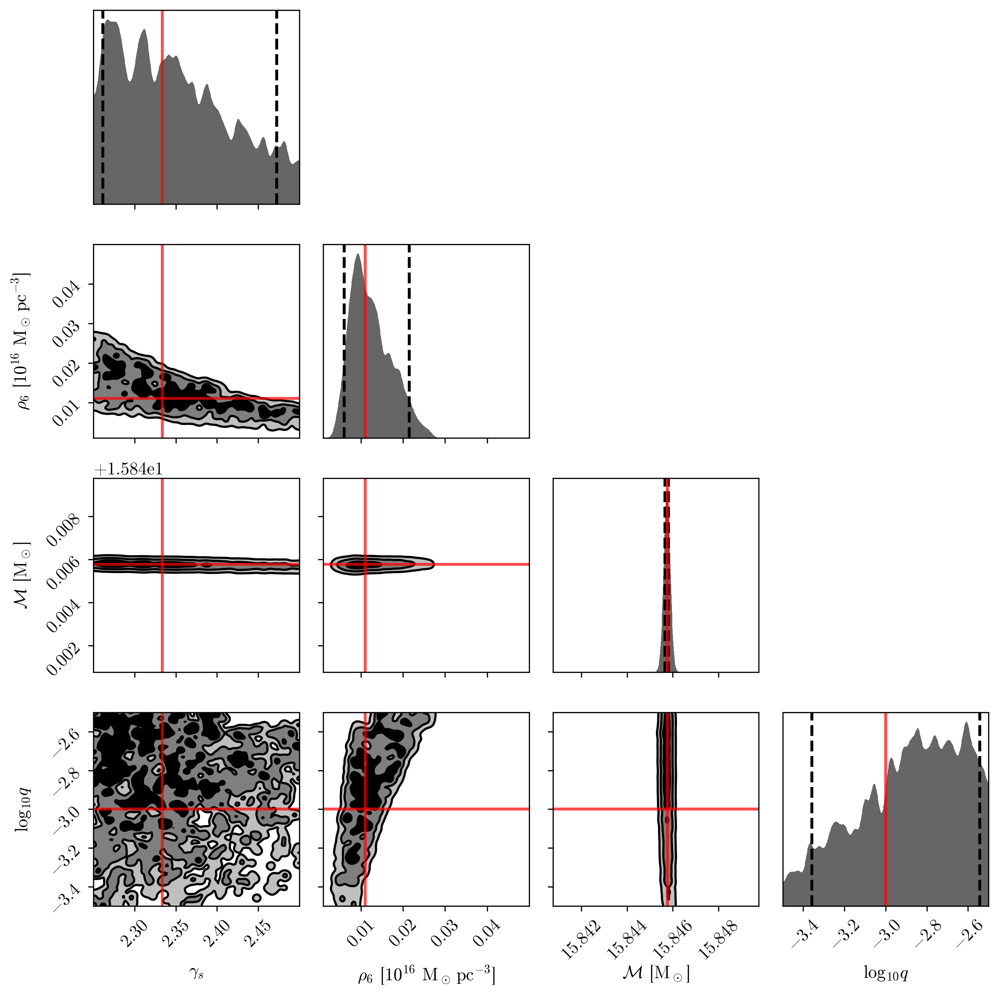

In [138]:
cfig, caxes = dyplot.cornerplot(
    results_evidence,
    labels=labels,
    quantiles=quantiles,
    quantiles_2d=quantiles_2d,
    smooth=0.015,
    truths=(
        gamma_s,
        rho_6_to_rho6T(rho_6),
        dd_s.M_chirp / MSUN,
        jnp.log10(dd_s.q),
    ),
    span=[1, 1, 1, 1]
)
cfig.tight_layout()
# cfig.savefig("ns-discoverable.pdf")
# cfig.savefig("ns-discoverable.png")

### Compute Bayes factor

In [145]:
rho_6_to_rho6T(
    root_scalar(
        lambda rho: get_rho_s(rho, 1e3 * MSUN, 2.5) - 1e3 * MSUN / PC ** 3,
        bracket=(1e-6, 1e2),
        rtol=1e-15,
        xtol=1e-100,
    ).root
)

6.2051784873830576

In [140]:
# Uncorrected Bayes factor from nested sampling
bayes_fact_ns = jnp.exp(results_evidence.logz[-1]) / jnp.exp(results_v.logz[-1])

# Correct for rho_6T prior, extending up to the most extreme rho_6T value we've
# considered
rho_6T_max = rho_6_to_rho6T(
    root_scalar(
        lambda rho: get_rho_s(rho, 1e5 * MSUN, 2.5) - 1000 * MSUN / PC ** 3,
        bracket=(1e-3, 1e2),
        rtol=1e-15,
        xtol=1e-100,
    ).root
)
rho_6T_fact = (rho_6T_range[1] - rho_6T_range[0]) / rho_6T_max

# Correct for different chirp mass priors
dM_fact = (dM_chirp_MSUN_range[1] - dM_chirp_MSUN_range[0]) / (
    M_chirp_MSUN_range_v[1] - M_chirp_MSUN_range_v[0]
)

bayes_fact_est = dM_fact * rho_6T_fact * bayes_fact_ns
print(f"The Bayes factor is {bayes_fact_est}")

The Bayes factor is 981.5055702739613
